# Overview

### What's in this notebook?
- We construct functions for face detection, facial landmark detection, and facial alignment using **OpenCV**
and **dlib**
- We apply created functions to process all celeba images into new directory and generate table of all facial landmarks

### Explanation of Functions Used:

**dlib.get_frontal_face_detector**
- This is dlib's pretrained HOG+SVM model used to locate faces within images
- Comes downloaded with dlib library API
- Input: an image; # of pyramid layers to apply to upscale/increase resolution of image (allows for multiple faces to be detected)
- Output: object representing bounding box of a face (or multiple) in image

**dlib.shape_predictor('shape_predictor_68_face_landmarks.dat')**
- This is dlib's pretrained facial landmark detector (uses ensemble of regression trees to predict 68 (x,y) facial landmarks
- Must be downloaded from internet and placed into your directory 
- Input: image; bounding box output from dlib's get_frontal_face_detector
- Output: object containing information on facial landmarks

### Import Libraries and Pre-built Models:

In [3]:
import numpy as np
import dlib
import cv2
import pandas as pd
import os

import matplotlib.pyplot as plt
%matplotlib inline

def load_pretrained_models(face_detector=dlib.get_frontal_face_detector(),
                           facial_landmark_predictor=dlib.shape_predictor('models/shape_predictor_68_face_landmarks.dat'),
                           key_landmark_indices=pd.read_csv('models/dlib_pred_key_landmarks.csv', index_col='model')):
    """
    Import face detection and facial landmark detection models; Import indices corresponding to
    specified landmark detection model that represent key facial landmarks to be used for facial alignment
    """
    
    detector =  face_detector
    predictor =  facial_landmark_predictor
    
    face_center = key_landmark_indices.loc['dlib']['face_center']
    left_eye = key_landmark_indices.loc['dlib']['left_eye']
    right_eye = key_landmark_indices.loc['dlib']['right_eye']
    landmark_count = key_landmark_indices.loc['dlib']['landmark_count']
    
    return detector, predictor, face_center, left_eye, right_eye, landmark_count

detector, predictor, face_center, left_eye,right_eye, landmark_count = load_pretrained_models()

### Read in and prepare image:

Original Shape:  (500, 400, 3)
Resized Shape:  (625, 500, 3)


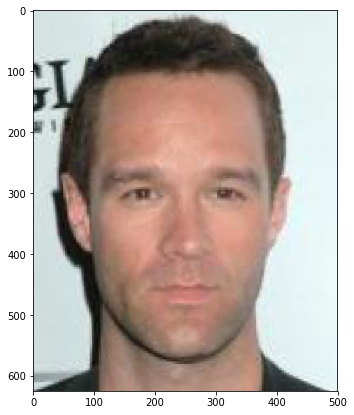

In [6]:
# "dad_ireland.jpg"
# "RHedges_face.jpg"
# "kara_xmas.jpg"

def load_preprocess_image(image, resize_width=None, show_image=True):
    """Import image, resize image, and display image (optional)"""
    
    # IMPORT IMAGE
    image_bgr = cv2.imread(image, cv2.IMREAD_COLOR)
    
    if resize_width != None:
        # RESIZE IMAGE
        (h, w) = image_bgr.shape[:2] # initial image shape
        ratio = resize_width / float(w) # resizing ratio
        image_resized = cv2.resize(image_bgr,
                                  (resize_width,int(h * ratio)),
                                  interpolation=cv2.INTER_AREA)
    else:
        image_resized = image_bgr

    # DISPLAY IMAGE
    if show_image == True:
        image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
        print("Original Shape: ", image_bgr.shape)
        print("Resized Shape: ", image_rgb.shape)
        plt.figure(figsize=(7, 7))
        plt.imshow(image_rgb)
        
    return image_resized

# image_resized = load_preprocess_image("data/val/no_attribute/165443.jpg", resize_width=500, show_image=True)

# Face and Landmark Detection

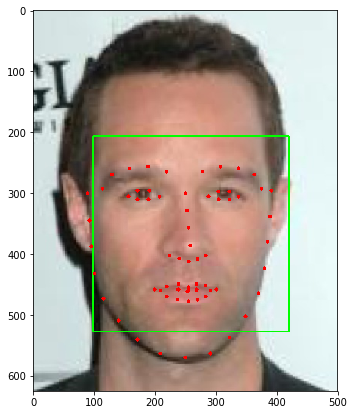

In [8]:
def face_landmark_detection(image_resized, face_detector=detector,
                            facial_landmark_predictor=predictor, landmark_count=landmark_count,
                            show_image=True):
    
    """
    Detect face, identify facial landmarks, and display image
    with bounding box and landmark annotations (OPTIONAL)
    """
    
    image_ready = image_resized.copy()

    
    # DETECT FACE
    rect = face_detector(image_ready, 1) # detect the face
    if len(rect) == 0:
        print("No Face Detected")
        empty = np.empty((136,))
        empty[:] = np.nan
        return empty # if no face is detected, return
    
    rect = rect[0]
    (x, y, h, w) = (rect.left(), rect.top(),
                    rect.right() - rect.left(), rect.bottom() - rect.top()) # get bounding box coordinates
    cv2.rectangle(image_ready, (x, y), (x + w, y + h), (0, 255, 0), 2) # display bounding box

    
    # IDENTIFY FACIAL LANDMARKS
    shape = facial_landmark_predictor(image_ready, rect) # predict all facial landmarks
    facial_landmarks = np.ones((landmark_count,2), dtype=int)
    for i in range(landmark_count):
        facial_landmarks[i] = [shape.part(i).x, shape.part(i).y] # convert facial landmarks to numpy array
    for (x, y) in facial_landmarks:
        cv2.circle(image_ready, (x, y), 3, (0, 0, 255), -1) # annotate landmarks on image

        
    # DISPLAY IMAGE
    if show_image == True:
        display_image = cv2.cvtColor(image_ready, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(7, 7))
        plt.imshow(display_image)
        
    return facial_landmarks.flatten()
    
# test = face_landmark_detection(image_resized, show_image=True)

# Facial Alignment

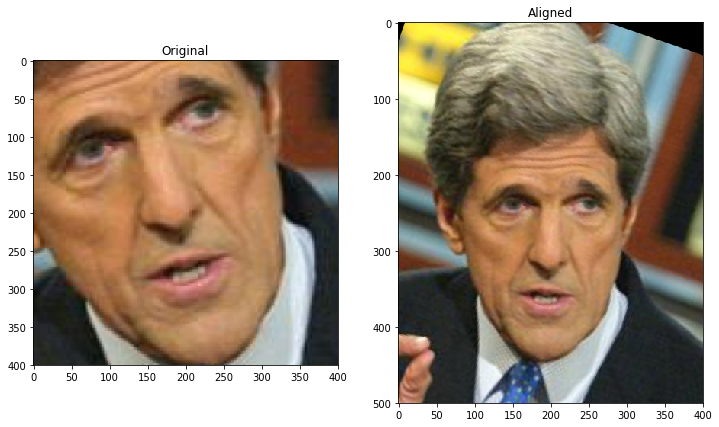

In [4]:
def align_face(image_resized, face_detector=detector, facial_landmark_predictor=predictor,
               face_center=face_center, left_eye=left_eye, right_eye=right_eye,landmark_count=landmark_count,
               zoom_factor=.32, y_axis_align=.48, output_height_dim=500, output_width_dim=400,
               show_im_align=True, show_im_orig=True):
    """
    Detect face and facial landmarks; use key landmarks to calculate face angle and scale factor as inputs to
    affine transformation; apply affine transformation to align face;
    display original and aligned faces (OPTIONAL)
    """
    
    image_ready = image_resized.copy()
    
    
   # DETECT FACE AND FACIAL LANDMARKS
    rect = face_detector(image_ready, 1) # detect the face
    if len(rect) == 0:
#         print("No Face Detected")
        return # if no face is detected, return
    rect = rect[0]
    shape = facial_landmark_predictor(image_ready, rect) # predict all facial landmarks
    facial_landmarks = np.ones((landmark_count,2), dtype=int)
    for i in range(landmark_count):
        facial_landmarks[i] = [shape.part(i).x, shape.part(i).y] # convert facial landmarks to numpy array


    # IDENTIFY KEY POINTS NEEDED FOR TRANSFORMATION
    face_center = facial_landmarks[face_center] # this is the center of the face (midpoint between eyes)
    left_eye = facial_landmarks[left_eye]
    right_eye = facial_landmarks[right_eye]


    # CALCULATE CURRENT FACE ANGLE
    eyes_dist_y = right_eye[1] - left_eye[1]
    eyes_dist_x = right_eye[0] - left_eye[0]
    face_angle = np.degrees(np.arctan2(eyes_dist_y, eyes_dist_x))


    # CALCULATE SCALE FACTOR
    eyes_distance_orig = np.linalg.norm(left_eye - right_eye) # current Euclidean distance between eyes
    
    left_eye_output = (zoom_factor, zoom_factor)
    right_eye_output_x = 1 - left_eye_output[0] # set right eye location to mirror left eye across 
    output_eye_dist_x = right_eye_output_x - left_eye_output[0] # calculate output distance between eyes as a ratio of image
    output_eye_dist_x_adjusted = output_width_dim * output_eye_dist_x # calculate absolute output distance between eyes
   
    scale_factor = output_eye_dist_x_adjusted / eyes_distance_orig # total scale factor

    
    # CONSTRUCT TRANSFORMATION MATRIX
    transformation_matrix = cv2.getRotationMatrix2D((face_center[0], face_center[1]),
                                                    face_angle,
                                                    scale_factor)
    adj_x = output_width_dim * .5 # this horizontally centers the face in the image
    adj_y = output_height_dim * y_axis_align # this vertically centers the face in the image
    transformation_matrix[0, 2] += adj_x - face_center[0]
    transformation_matrix[1, 2] += adj_y - face_center[1]


    # APPLY AFFINE TRANSFORMATION TO ALIGN FACE
    aligned_face = cv2.warpAffine(image_ready,
                                  transformation_matrix,
                                  (output_width_dim, output_height_dim),
                                 )
    
    # EXTRACT AND DISPLAY ORIGINAL FACE
    if show_im_orig == True: 
        (x, y, h, w) = (rect.left(), rect.top(),
                        rect.right() - rect.left(), rect.bottom() - rect.top()) # get face annotations
        ratio = output_width_dim / float(w)
        original_face = cv2.resize(image_ready[y:y + h, x:x + w],
                                   (output_width_dim, int(h * ratio)),
                                  interpolation = cv2.INTER_AREA)
        
        display_im_orig = cv2.cvtColor(original_face, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 12))
        plt.subplot(1,2,1); plt.imshow(display_im_orig); plt.title("Original")
        
    # DISPLAY ALIGNED IMAGE    
    if show_im_align == True:
        display_im_align = cv2.cvtColor(aligned_face, cv2.COLOR_BGR2RGB)
        plt.subplot(1,2,2); plt.imshow(display_im_align); plt.title("Aligned")
        
    
    return aligned_face


# aligned_face = align_face(image_resized,
#                           show_im_align=True, show_im_orig=True)

# Process All Images
Loop through all **celeba** images and:
- 1) Apply the facial alignment function to each image and save to new directory
- 2) Extract the 68 landmarks for each image and save to numpy file and a csv file

In [197]:
def process_images_and_landmarks():
    f = open("data/processed_images_cropped.txt","w+")
    landmarks_table = np.zeros((len(os.listdir('data/celeba')),136))
    for i, image in enumerate(os.listdir('data/celeba')):
        image_load = load_preprocess_image('data/celeba/'+image, resize_width=500, show_image=False)
        aligned_face = align_face(image_load,show_im_align=False, show_im_orig=False)


        if aligned_face is None:
            f.write(image)
            f.write(" -- No Face Found")
            f.write('\n')
        else:
            cv2.imwrite("data/celeba_aligned_cropped/{}".format(image), aligned_face)
            landmarks = face_landmark_detection(aligned_face, show_image=False)
            landmarks_table[i,:] = landmarks
            f.write(image)
            f.write('\n')
        if i % 10000 == 0:
            print(i)
            np.save("data/landmarks_table_cropped", landmarks_table)
    f.close()
    
    np.save("data/landmarks_table_cropped", landmarks_table) # save as numpy file
    
    landmarks_table_cropped = np.load("data/landmarks_table_cropped.npy") #reload the numpy file

    columns = np.array([]) # Generate your column names
    for i in np.arange(136):
        if i % 2 == 0:
            columns = np.append(columns, str(int(i / 2)) + "x")
        else:
            columns = np.append(columns, str(i // 2) + "y")

    landmarks_cropped_df = pd.DataFrame(landmarks_table_cropped, columns=columns, # create a pandas df
                                        index=os.listdir('data/celeba'))

    landmarks_cropped_df.to_csv("data/landmarks_cropped_df.csv") # save your pandas df
    
# def process_images_and_landmarks()

# Testing Examples

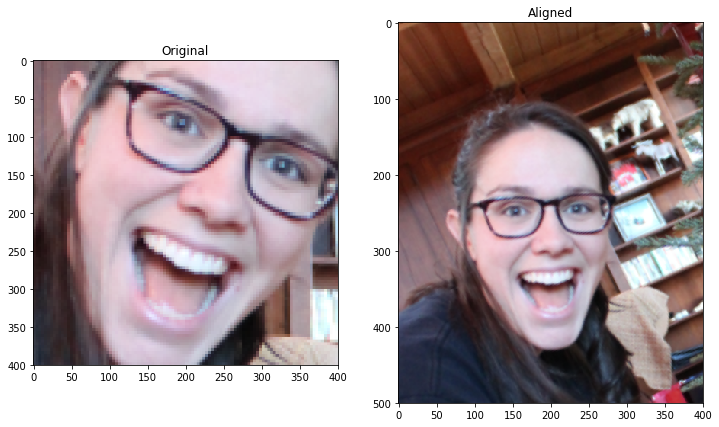

In [10]:
image = load_preprocess_image("images/kara_xmas.jpg",show_image=False)
aligned_face = align_face(image)


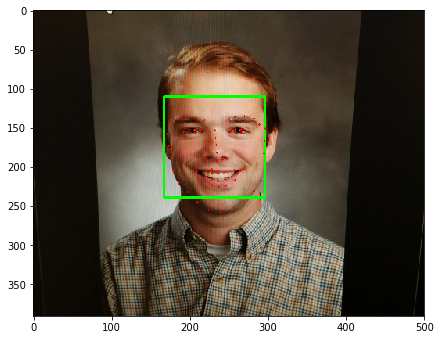

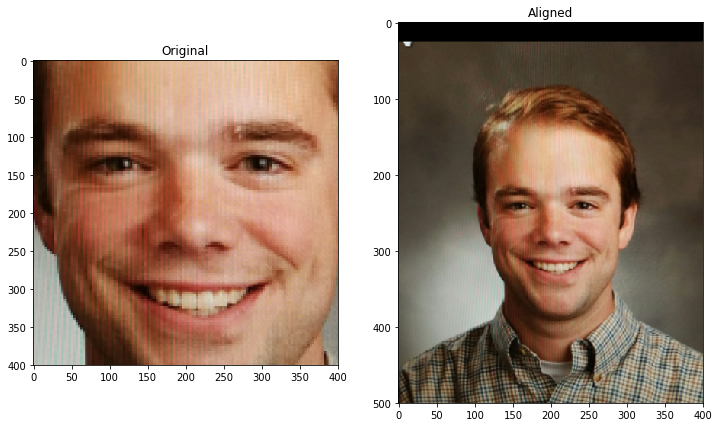

In [74]:
image = load_preprocess_image("images/RHedges_face.jpg",show_image=False)
face_landmark_detection(image)
aligned_face = align_face(image)

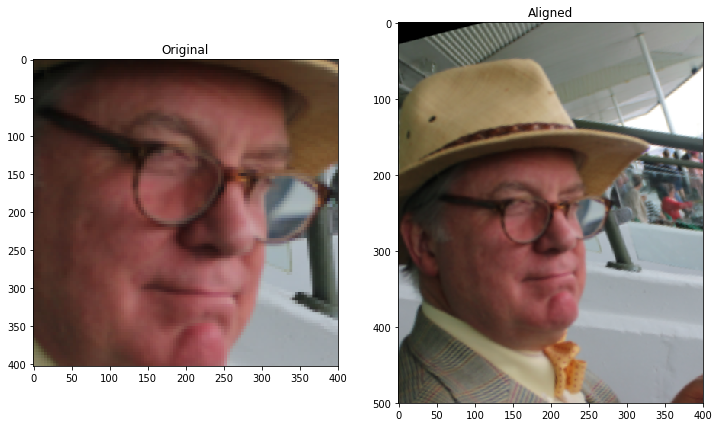

In [75]:
image = load_preprocess_image("images/dad_ireland.jpg",show_image=False)
aligned_face = align_face(image)

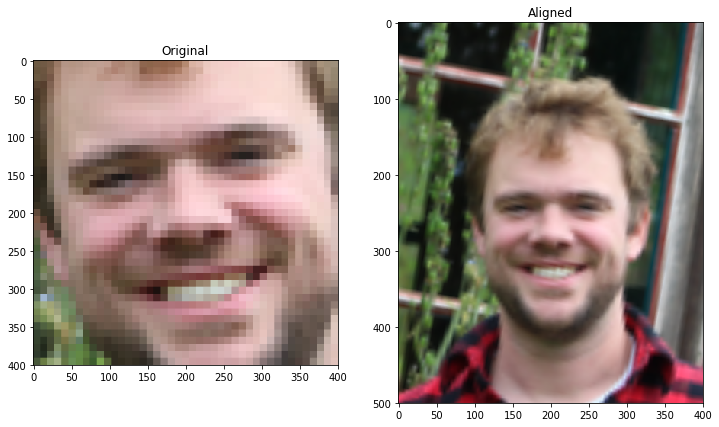

In [76]:
image = load_preprocess_image("images/ryan_01.jpg",show_image=False)
aligned_face = align_face(image)

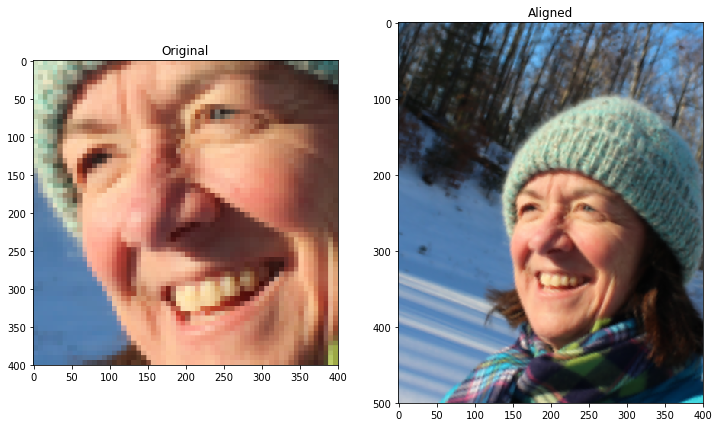

In [77]:
image = load_preprocess_image("images/mom.jpg",show_image=False)
aligned_face = align_face(image)

Testing on In the Wild images:

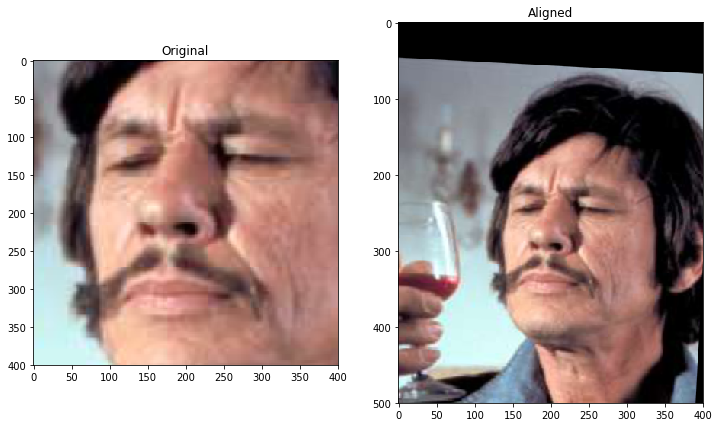

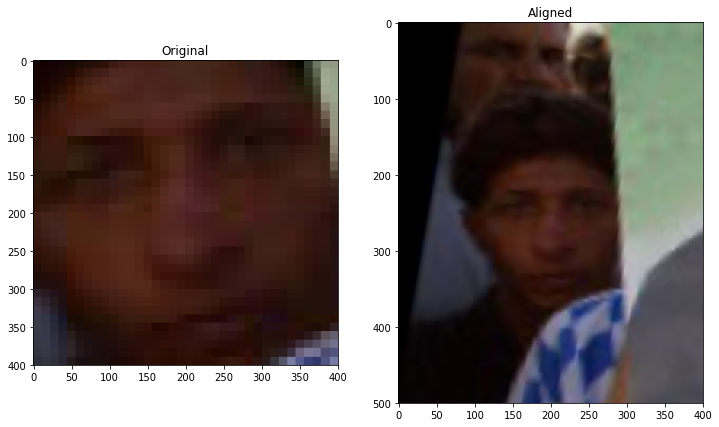

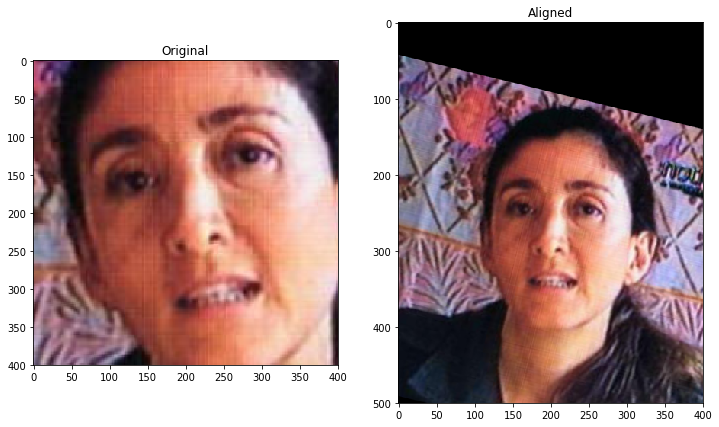

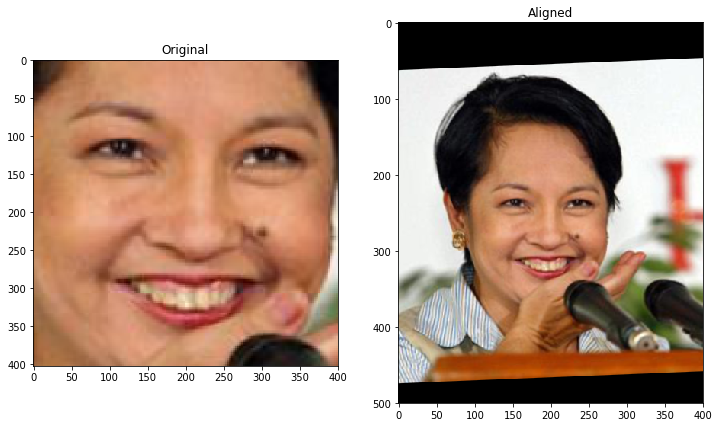

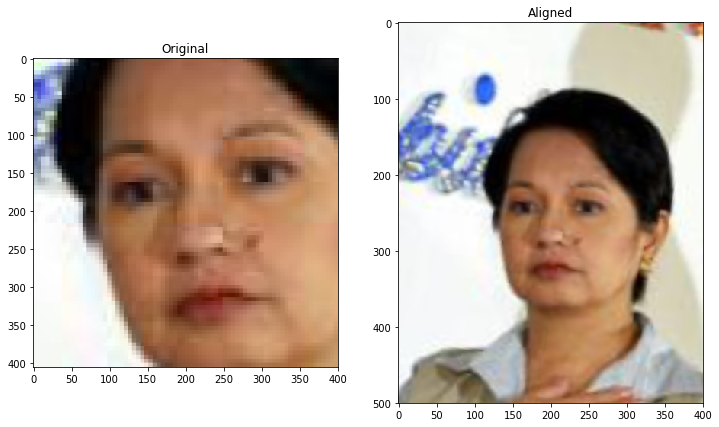

...

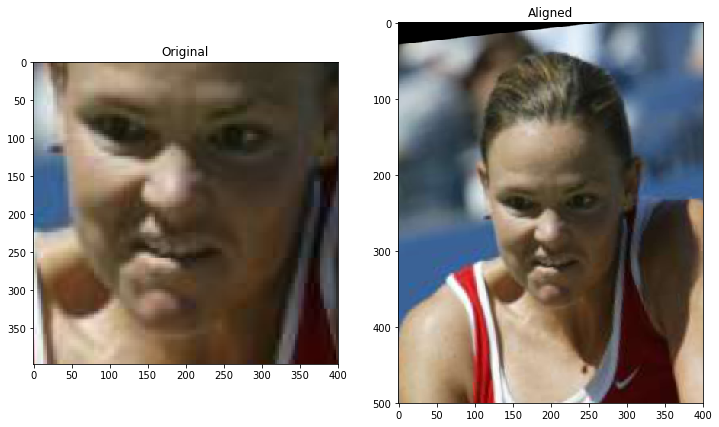

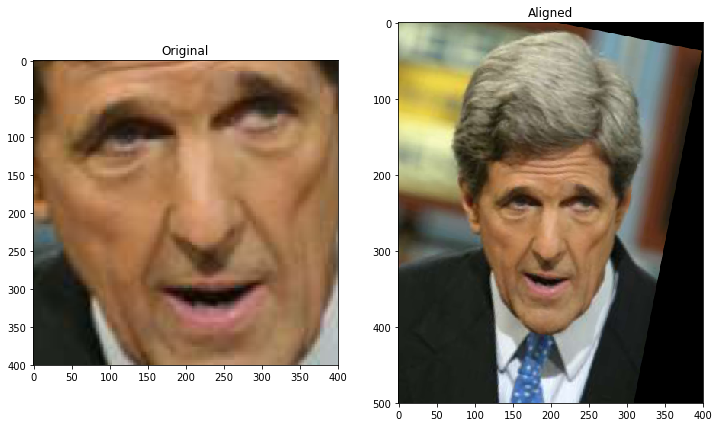

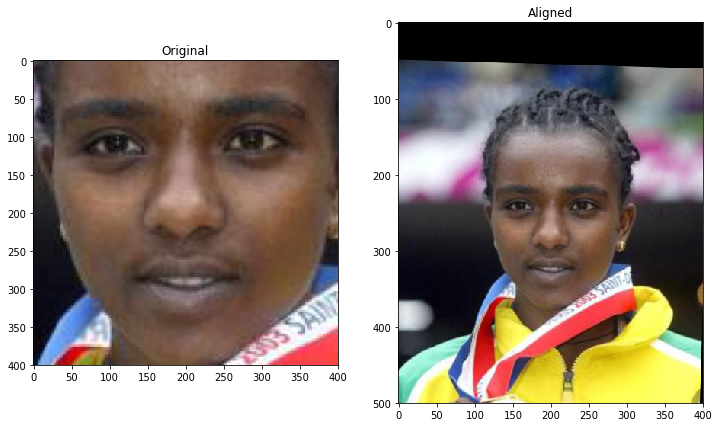

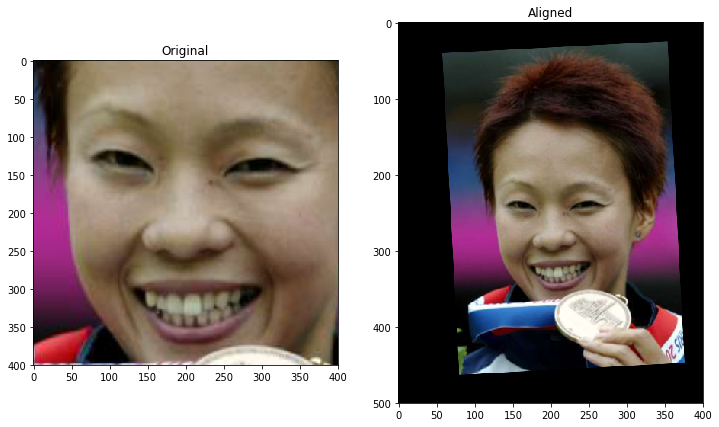

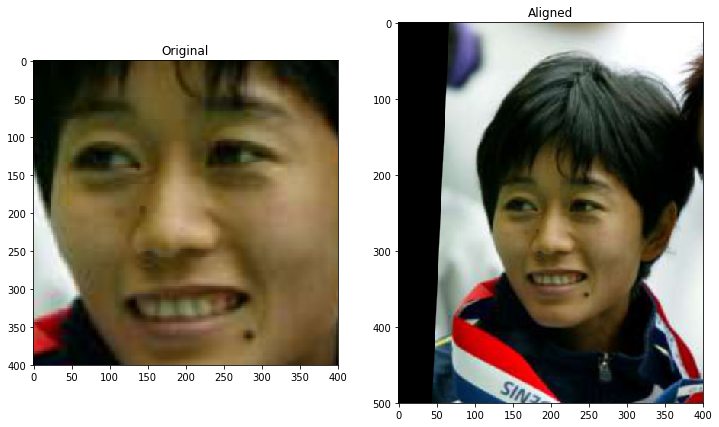

In [10]:
for image in os.listdir('images/align_testing')[:20]:
    image = load_preprocess_image('images/align_testing/'+image, resize_width=500, show_image=False)
    aligned_face = align_face(image)

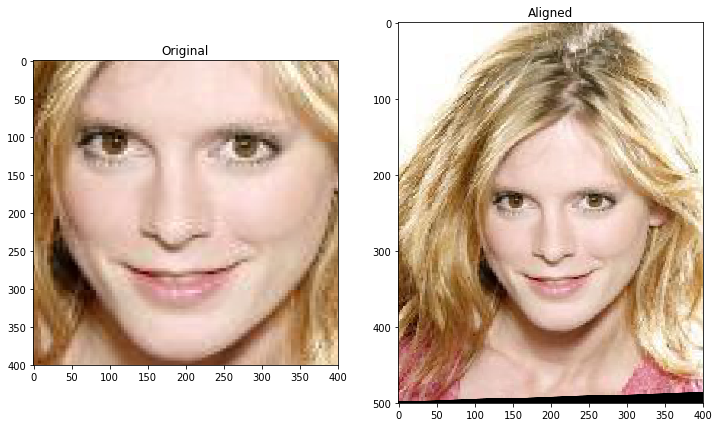

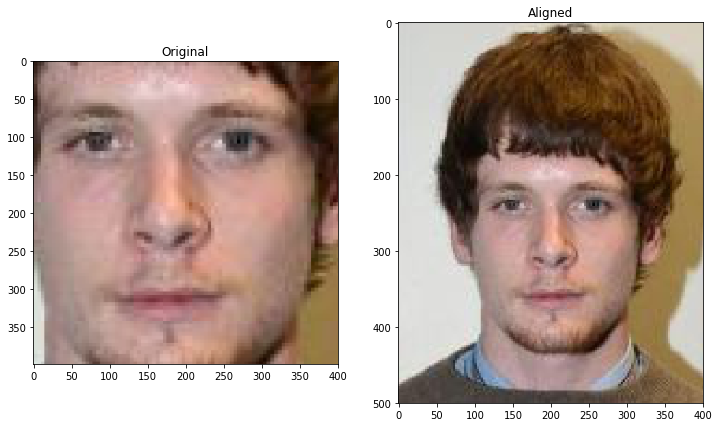

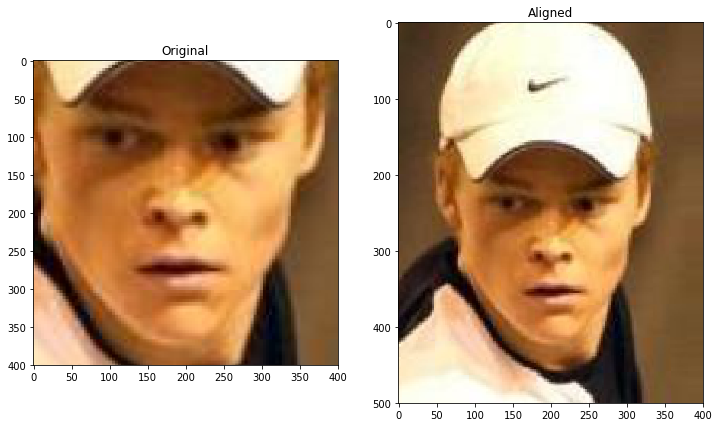

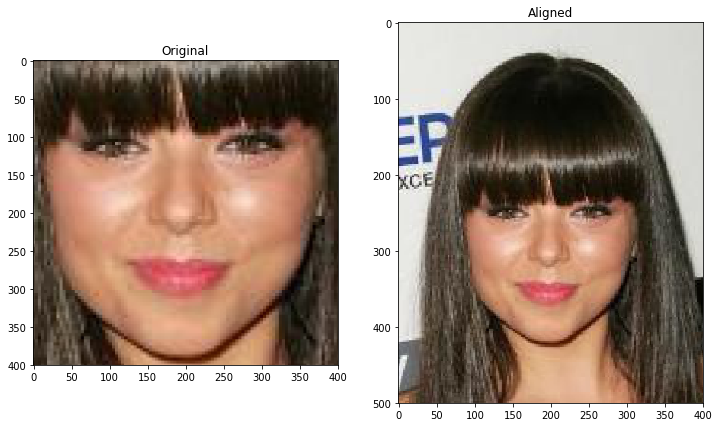

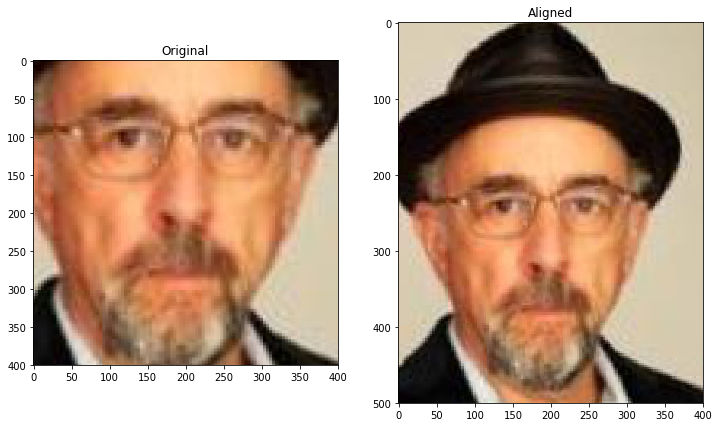

...

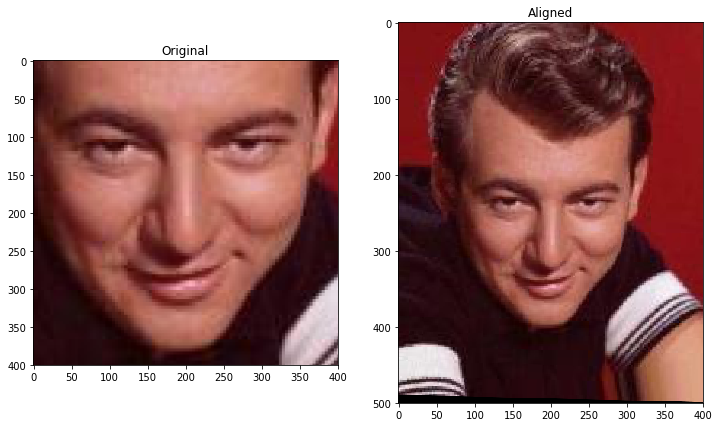

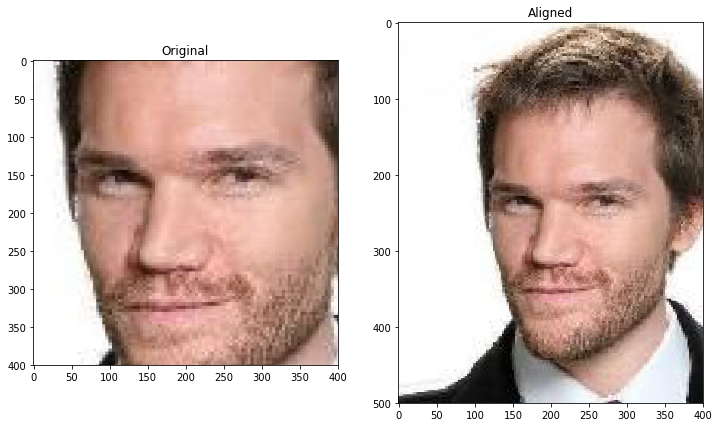

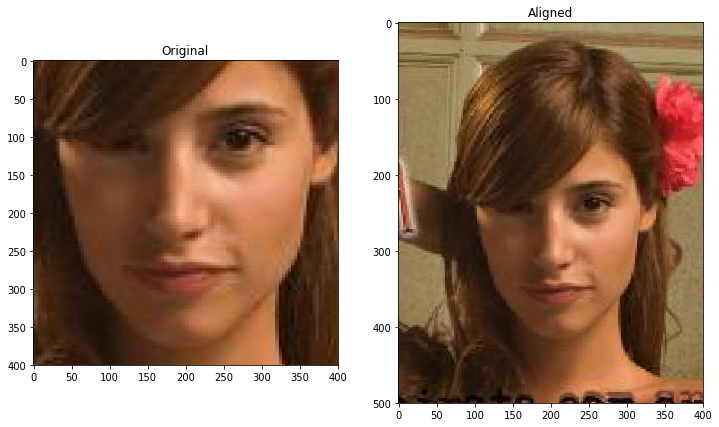

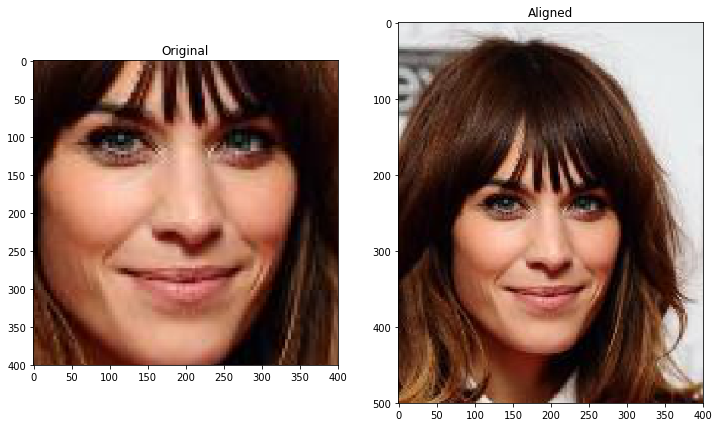

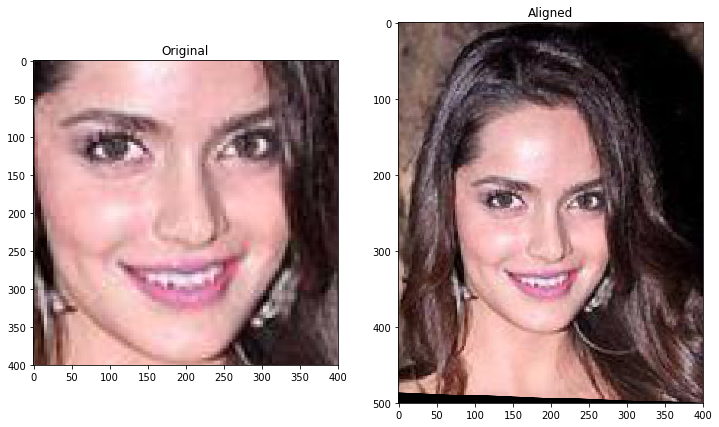

In [22]:
for image in os.listdir('images/align_testing2'):
    image = load_preprocess_image('images/align_testing2/'+image, resize_width=1000, show_image=False)
    aligned_face = align_face(image)